# <a href="https://mipt-stats.gitlab.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. `Pandas` и `Seaborn`

При возникновении сложностей, связанных с Питоном и библиотеками, посмотрите материалы видео-курса <a href="https://mipt-stats.gitlab.io/courses/python.html">Python для анализа данных</a>. Если не помогло, задайте вопрос по заданию.

**Правила:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ad21_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Работы, присланные иным способом, не принимаются.
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно ноутбук в формате ipynb. 
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*


**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 4 балла
* Задача 2 &mdash; 2 балла

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 5 баллов
* Задача 4 &mdash; 3 балла
* Задача 5 &mdash; 8 баллов

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1

Представьте, что вы министр образования страны котиков. Вам нужно решить какие школы лучше: маленькие или большие. Вы решили, что нужно сравнить их по результатам единого кошачьего экзамена (ЕКЭ). Предлагается посмотреть на средний результат по школам: отсортировать по нему и сделать выводы исходя из топ 10 лучших школ.

Вам дан датасет `cat_exam_data.csv` со следующими полями:
* `school` &mdash; номер школы;
* `test_score` &mdash; результат одного ученика из этой школы;
* `number_of_students` &mdash; кол-во учеников в школе.

Приведены данные по всем ученикам из 500 школ страны котиков.

![w4oyxb8kmIQ.jpg](attachment:w4oyxb8kmIQ.jpg)

Загрузите датасет с результатами экзамена и посмотрите на первые пять строк.

*Подсказка.* Это можно сделать с помощью методов  <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html">read_csv</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.head.html">head</a>.

In [3]:
data = pd.read_csv('cat_exam_data.csv')
data.head()

,school,test_score,number_of_students
0,26,39.0,965
1,54,64.0,1483
2,356,64.0,1055
3,108,68.0,1806
4,298,78.0,971


Проверьте, что в данных нет пропусков (`NaN`). Если они есть:
* проверьте в каком столбце;
* удалите их.

*Подсказка.* Могут помочь методы <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.isna.html">isna</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html">dropna</a>.

Проверка столбцов на наличие `Nan`

In [4]:
data.isna().mean()

school                0.000000
test_score            0.000407
number_of_students    0.000000
dtype: float64

Удаление строк в которых имеется `Nan`

In [5]:
data = data.dropna(how = 'any')
data.isna().mean()

school                0.0
test_score            0.0
number_of_students    0.0
dtype: float64

Посчитайте описательные статистики (среднее, мин, макс, и тд.) по колонкам в таблице с помощью одной функции.

In [6]:
data.describe()

,school,test_score,number_of_students
count,501358.000000,501358.000000,501358.000000
mean,250.096795,51.681788,1088.910569
std,144.428420,14.179981,281.016801
min,0.000000,-0.000000,156.000000
25%,125.000000,42.000000,890.000000
50%,250.000000,52.000000,1079.000000
75%,377.000000,61.000000,1285.000000
max,499.000000,100.000000,1806.000000


Отдельного внимания заслуживает среднее. Какими способами его можно посчитать? Произведите вычисления и *подробно* проинтерпретируйте результаты. Что стоит публиковать в официальной статистике?

**Cредние**

Вообще, мы проходили три вида средних. Это медиана, среднее арифметическое и мода. 

**Какими способами его можно посчитать?**

Среднее можно посчитать просто просуммировав все значения и поделив на и кол-во, медиана же смотрится после сортировки и смотрится серединный элемент в отсортированной последовательности. В моде просто смотрим кол-во каждого элемента и берем элемент наиболее встречающейся.

**Произведите вычисления**

Первые два для всех объектов уже посчитана, где `mean` --- среднее арифметическое, а $50%$ --- медиана, моду см. следущую ячейку кода. 


In [7]:
data.mode()

,school,test_score,number_of_students
0,108,52.0,1244


**Подробно проинтерпретируйте результаты**

Кажется понятно, что интерпритирует среднее арифметическое. Даже по названию понятно. И это очень интуитиваня вещь. По поводу медианы, мы просто говорим, что это такая величина, что вероятность получить значение справа от него равна вероятности получить значение слева от него. По крайней мере, я так интерпретирую медиану. Мода --- тоже интуитивная вещь наиболее часто встречающееся значение.

**Что стоит публиковать в официальной статистике?**

Ну я бы вначале нарисовал гистограммы

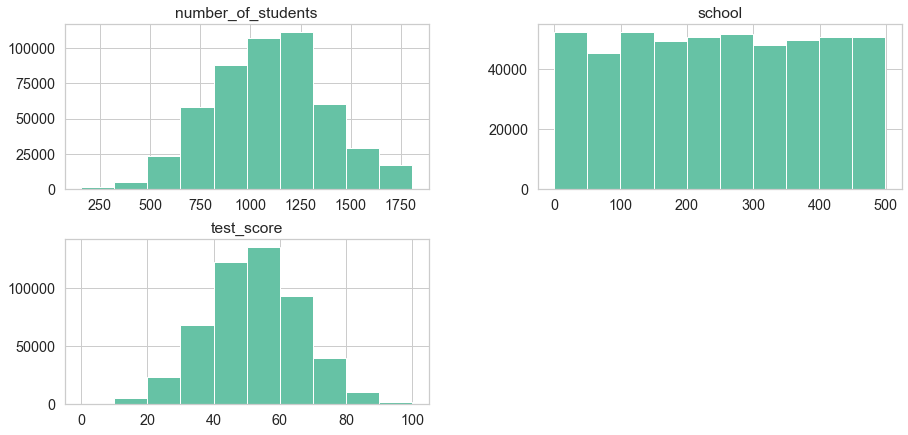

In [8]:
data.hist(figsize=(15,7), bins = 10)
None

Честно говоря, я бы в трех случаях опубликовал бы средние. Дело в том, что, насколько я помню, модиану применяют тогда, когда у нас выбросы, ведь она более устойчива к ним. В данном случае выбросов не видно не в одном из признаков. Хотя они почти не отличаются во всех признаках. Аналогично с модой в признаках `number_of_students`, `test_score`. Но вот, что точно не стал бы делать --- публиковать моду в `school`. Потому что, у нас это похоже на равномерное распределение, а мода здесь не к месту и сильно отличается от среднего и модианы.

Посчитайте сколько котиков получили 100 баллов.

In [9]:
data.loc[data.test_score == 100, 'test_score'].count()

51

Выведите подробную информацию о школах, где есть хотя бы один котик, получивший 100 баллов на ЕКЭ.
Отсортируйте эти школы по количеству стобалльников.

*Подсказка.* Могут помочь методы <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html">groupby</a>, <a target="_blank" href="https://pandas.pydata.org/pandas-docs/version/0.23.4/generated/pandas.DataFrame.sort_values.html">sort_values</a>, <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.transform.html">transform</a> и <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.count.html">count</a>.

Сортировка школ по количеству стобалльников.

In [10]:
data.loc[data.test_score == 100,:].groupby(by = ['school', 'number_of_students'], as_index=False)\
    .count().sort_values(by = 'test_score', ascending = False)\
    .rename(columns = {'test_score':'count'}).head()

,school,number_of_students,count
48,486,800,2
0,4,1015,1
37,395,436,1
27,302,1517,1
28,303,701,1


Посчитайте средний результат каждой из школ и посмотрите на результат. Рассматриваем все школы, не только со стобальниками.

*Подсказка.* Может помочь метод <a target="_blank" href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.mean.html">mean</a>.

In [11]:
data_mean_score = data.groupby(by = ['school', 'number_of_students'], as_index=False).mean()
data_mean_score.rename(columns = {'test_score': 'mean_test_score'}, inplace = True)
data_mean_score.head(10)

,school,number_of_students,mean_test_score
0,0,418,52.294258
1,1,1209,52.028950
2,2,1035,51.751451
3,3,1245,51.566265
4,4,1015,51.025641
5,5,988,51.394737
6,6,914,52.063527
7,7,1265,51.670356
8,8,1036,51.543436
9,9,766,52.260471


Отсортируйте школы по среднему результату.

In [12]:
data_mean_score.sort_values(by = 'mean_test_score', ascending = False, inplace = True)

Посмотрите на топ 10 лучших результатов.

In [13]:
data_mean_score.head(10)

,school,number_of_students,mean_test_score
57,57,560,53.341682
124,124,598,52.993311
263,263,669,52.982063
82,82,555,52.981982
366,366,773,52.970207
465,465,1179,52.957555
169,169,858,52.932401
449,449,357,52.910364
477,477,808,52.898515
464,464,431,52.865429


**Вывод:**  Ну в топе все школы кроме одной являются маленькими. Что значит мальенкие и большие см. ниже.

Ожидаем, что внизу рейтинга будут только большие школы, давайте это проверим. Посмотрите теперь на 10 худших школ.

In [14]:
data_mean_score.tail(10)

,school,number_of_students,mean_test_score
383,383,636,50.716981
264,264,929,50.702906
48,48,649,50.690293
156,156,1093,50.641354
394,394,1079,50.461538
194,194,774,50.406977
471,471,960,50.362500
486,486,800,50.325000
211,211,351,50.248571
353,353,336,50.050595


**Вывод:** Опять маленькие школы. Это связано с тем, что у маленьких школ разброс от сренего больше см. дальше.

Постройте график зависимости среднего результата ЕКЭ от количества учеников.

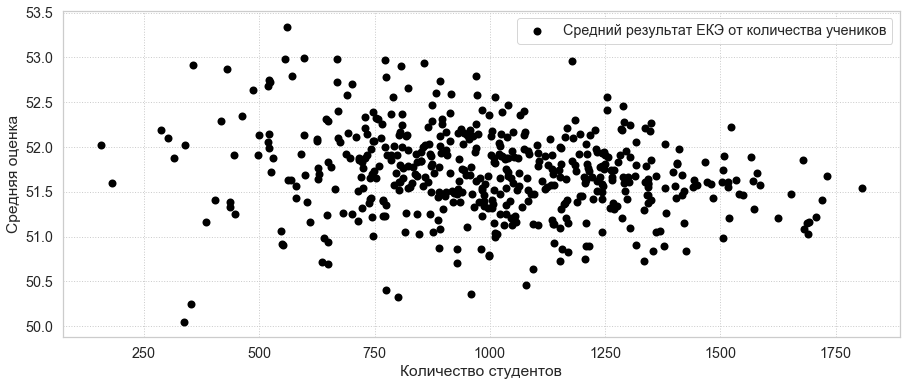

In [15]:
plt.figure(figsize = (15,6))

plt.scatter(data_mean_score.number_of_students,
         data_mean_score.mean_test_score,
         color = 'black',
         lw = 2,
         label = 'Средний результат ЕКЭ от количества учеников')
plt.xlabel('Количество студентов')
plt.ylabel('Средняя оценка')
plt.grid(ls = ':')
plt.legend()
plt.show()

**Вывод:** Ну видно, что чем больше студентов, тем меньше разброс

Но как же тогда решить какие школы лучше? 

Сгруппируйте учеников в зависимости от типа школы, получив тем самым два датасета. Будем считать, что школа небольшая, если в ней не более 1000 учеников.

In [16]:
small_school = data_mean_score.loc[data_mean_score.number_of_students <= 1000, :]
big_school = data_mean_score.loc[data_mean_score.number_of_students > 1000, :]

Постройте гистограммы этих двух выборок на одном графике, установив параметры
* `bins=10` &mdash; число бинов гистограммы;
* `alpha=0.5` &mdash; прозрачность бинов.

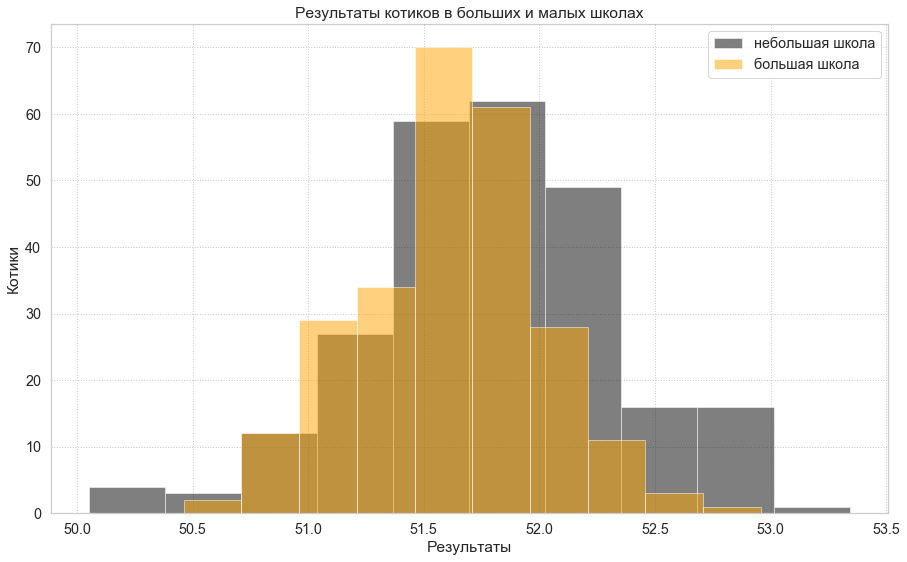

In [33]:
plt.figure(figsize = (15,9))

plt.hist(small_school.mean_test_score,
        bins = 10,
        alpha = 0.5,
        label = 'небольшая школа',
        color='black')

plt.hist(big_school.mean_test_score,
        bins = 10,
        alpha = 0.5,
        label = 'большая школа',
        color='orange')

plt.grid(ls = ':')
plt.xlabel('Результаты')
plt.ylabel('Котики')
plt.title('Результаты котиков в больших и малых школах')
plt.legend()
plt.show()

**Вывод:** Как видно, маленьких школ разброс больше, чем у больших. К этому можно прикрутить ЗБЧ, так чем больше экспериментов(ученико), тем точнее эксперимент и сходится к среднему. Только это не совсем точно, т.к. они должны быть независимы, поэтому это лишь предположение

### Задача 2

Задача заключается в работе с данными о трендах на <a target="_blank" href="https://www.youtube.com/">YouTube</a>. В этом вам поможет библиотека `seaborn`, которая была рассмотрена на одной из последних лекций.

![image17.png](attachment:image17.png)


<b>1. Подготовка данных</b>

Скачайте файл `RUvideos_short.csv` с данными о видео в российском сегменте Youtube с 14 ноября по 21 ноября 2017 года. Полная версия данных доступна на <a target="_blank" href="https://www.kaggle.com/datasnaek/youtube-new#RUvideos.csv">kaggle</a>.

Прочитайте данные с помощью библиотеки `pandas` и напечатайте начало таблицы. В колонке `trending_date` записана дата. При чтении таблицы распознайте ее.

*Замечание. Часто считывание дат &mdash; головная боль аналитика.*

In [66]:
data = pd.read_csv('RUvideos_short.csv', parse_dates = ['trending_date'],\
                   date_parser= lambda x: pd.to_datetime(x, format = '%y.%d.%m'))

data.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
0,gDuslQ9avLc,2017-11-14,Захар и Полина учатся экономить,Т—Ж БОГАЧ,22,2017-11-13T09:09:31.000Z,"захар и полина|""учимся экономить""|""копить день...",62408,334,190,50,https://i.ytimg.com/vi/gDuslQ9avLc/default.jpg,False,False,False,"Знакомьтесь, это Захар и Полина. Вместе с ними..."
1,AOCJIFEA_jE,2017-11-14,Биржа Мемов #29. Большой выпуск,Druzhko Show,22,2017-11-13T17:32:11.000Z,"биржа мемов|""лев шагинян""|""мемы""|""пикчи""|""друж...",330043,43841,2244,2977,https://i.ytimg.com/vi/AOCJIFEA_jE/default.jpg,False,False,False,"В 29 выпуске Дружко Шоу Сергей сказал, что Бир..."
2,VAWNQDgwwOM,2017-11-14,ХАЙП КЭМП - СВОЙ СРЕДИ ЧУЖИХ,Юлик,24,2017-11-13T16:11:31.000Z,"юмор|""комедия""|""влог""|""блог""|""смешно""|""смешное...",424596,49854,714,2944,https://i.ytimg.com/vi/VAWNQDgwwOM/default.jpg,False,False,False,http://kapitany.ru/!Yulik.cap - Факультет #Кап...
3,gknkFwKQfHg,2017-11-14,Сочная кесадилья с курицей,Hochland,22,2017-11-13T06:51:10.000Z,"хохланд|""сыр""|""рецепты""|""как приготовить""|""вку...",112851,3566,122,80,https://i.ytimg.com/vi/gknkFwKQfHg/default.jpg,False,False,False,*** как готовить ресторанные блюда дома
4,3sYvZcwzZr8,2017-11-14,КЛИПЫ РОДИТЕЛЕЙ НА ШКОЛЬНЫЙ ВЫПУСКНОЙ,Совергон,24,2017-11-13T16:52:36.000Z,"Совергон|""Sovergon""|""клипы""|""родители""|""школа""...",243469,36216,631,1692,https://i.ytimg.com/vi/3sYvZcwzZr8/default.jpg,False,False,False,❏ КОНКУРС КАПИТАНЫ: http://kapitany.ru/!Soverg...


В таблице много лишних данных. Оставьте следующие столбцы:
* `trending_date` &mdash; дата в формате год-день-месяц;
* `category_id` &mdash; категория видео, названия приведены в файле `RU_category_id.json`;
* `views` &mdash; количество просмотров видео;
* `likes` &mdash; количество лайков;
* `dislikes` &mdash; количество дислайков;
* `comment_count` &mdash; количество комментариев.

Из даты оставьте только день. Для этого можно пройтись циклом по всем датам и взять поле `day` у объекта даты. Напечатайте начало таблицы.

In [67]:
data = data.loc[:, ['trending_date', 'category_id', 'views', 'likes', 'dislikes', 'comment_count']]
for i, j in enumerate(data.trending_date):
    data.trending_date[i] = j.day
data.head()


c:\users\acer\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
c:\users\acer\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


,trending_date,category_id,views,likes,dislikes,comment_count
0,14,22,62408,334,190,50
1,14,22,330043,43841,2244,2977
2,14,24,424596,49854,714,2944
3,14,22,112851,3566,122,80
4,14,24,243469,36216,631,1692


<b>2. Некоторая визуализация</b>

Постройте ящики с усами на каждый день по количеству просмотров. Насколько хороший получился график?

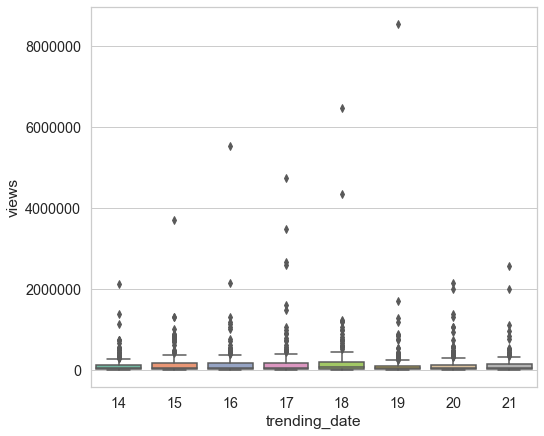

In [68]:
plt.figure(figsize=(8, 7))
sns.boxplot(x = 'trending_date', y = 'views', data=data)
plt.show()

Исправьте этот недостаток, установив некоторое значение. 

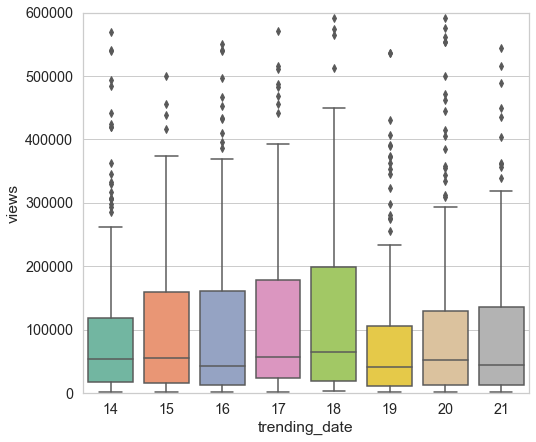

In [69]:
plt.figure(figsize=(8, 7))
sns.boxplot(x = 'trending_date', y = 'views',data=data)
plt.ylim(0, 600000)
plt.show()

Постройте `jointplot` по всем данным для количества просмотров по горизонтальной оси и количества лайков по вертикальной. Насколько информативен такой график?

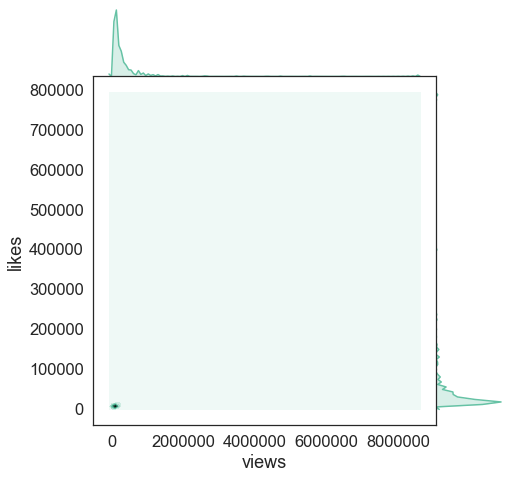

In [70]:
with sns.plotting_context("notebook", font_scale=1.5), sns.axes_style("white"):
    sns.jointplot(data.views, data.likes, kind='kde', height=7, space=0)

Исправьте этот недостаток.

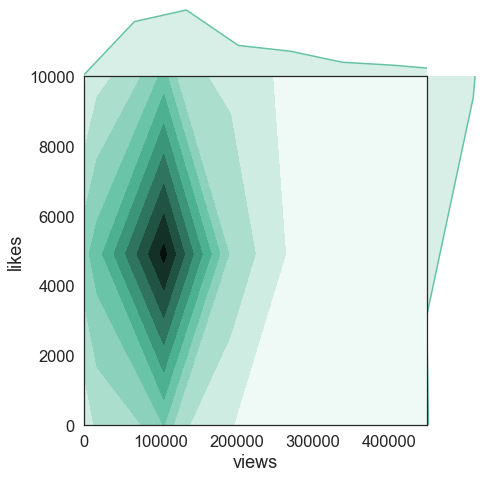

In [71]:
with sns.plotting_context("notebook", font_scale=1.5), sns.axes_style("white"):
    plot = sns.jointplot(data.views, data.likes, kind='kde', height=7, space=0)
    plot.ax_joint.set_xlim(0, 450000) 
    plot.ax_joint.set_ylim(0, 10000);


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 3

<a target="_blank" href="https://www.netflix.com">Netflix</a> за последние 5-10 лет обзавелись большим количеством зрителей. С увеличением числа зрителей увеличилось и разнообразие шоу. Соответственно, перед аналитиками из киноиндустрии встала задача исследования данных с рейтингами различных сериалов.  
В данном задании вам предстоит провести визуальный анализ датасета **1000 Netflix Shows** (по состоянию на 11.06.2017) и сделать выводы.  


![FiPEibYUxJc.jpg](attachment:FiPEibYUxJc.jpg)

Описание признаков:
* `title` &mdash; название шоу;
* `rating` &mdash; рейтинг шоу. Например: G, PG, TV-14, TV-MA;
* `ratingLevel` &mdash; описание рейтинговой группы и особенностей шоу;
* `release year` &mdash; год выпуска шоу;
* `user rating score` &mdash; оценка пользователей.


Загрузите данные, выполнив код ниже.

In [43]:
data = pd.read_csv('netflix_data.csv', encoding='cp437')

del data['ratingDescription'], data['user rating size']
data.head()

,title,rating,ratingLevel,release year,user rating score
0,White Chicks,PG-13,"crude and sexual humor, language and some drug...",2004,82.0
1,Lucky Number Slevin,R,"strong violence, sexual content and adult lang...",2006,NaN
2,Grey's Anatomy,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
3,Prison Break,TV-14,Parents strongly cautioned. May be unsuitable ...,2008,98.0
4,How I Met Your Mother,TV-PG,Parental guidance suggested. May not be suitab...,2014,94.0


Удалите из данных дупликаты. Сколько объектов удалено?

In [44]:
data.shape[0]

1000

In [45]:
data = data.drop_duplicates()
data.shape[0]

500

Сколько объектов осталось?

Осталось 500 объектов. Удалено 500, это видно из двух строчек выше.

Есть ли в данных пропуски?

Если да, то при дальнейшем анализе подумайте, как их корректнее обработать. Учтите, что многие методы умеют работать с пропусками.

In [46]:
data.isna().mean()

title                0.000
rating               0.000
ratingLevel          0.066
release year         0.000
user rating score    0.488
dtype: float64

In [47]:
data.ratingLevel = data.ratingLevel.fillna(value = data.ratingLevel.mode()[0])
data['user rating score'] = data['user rating score'].fillna(value = data['user rating score'].mean())

Логично, что пропуски заполнять стоит средними.

`user rating score` --- числового типа, поэтому для меня логичнее заполнить пропуски средним значением, так как это наиболее интуитивное среднее.

`ratingLevel` --- категориальный тип, поэтому с ним дела обстоят иначе. У нас один выбор и это мода.

Сколько рейтинговых групп представлено в данных?

In [48]:
data.rating.unique().shape[0]

13

Какие оценки пользователи ставят чаще? Постройте гистограмму оценок.

No handles with labels found to put in legend.


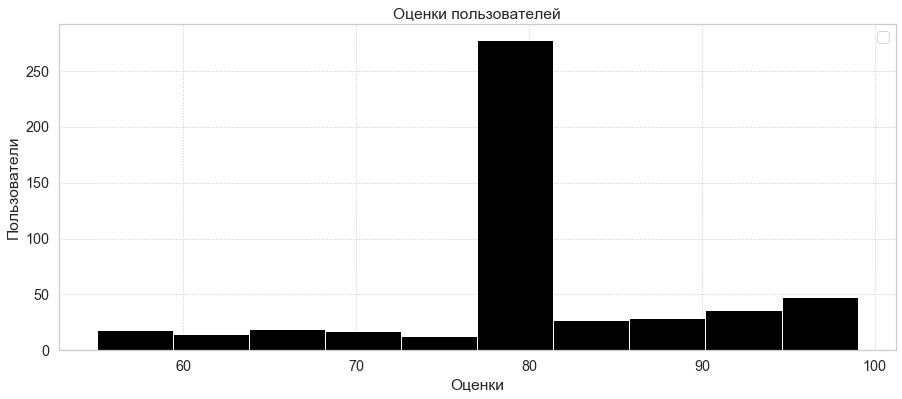

In [49]:
plt.figure(figsize = (15,6))

plt.hist(data['user rating score'],
        bins = 10,
        color='black')

plt.grid(ls = ':')
plt.xlabel('Оценки')
plt.ylabel('Пользователи')
plt.title('Оценки пользователей')
plt.legend()
plt.show()

**Вывод:** Пользователи ставят высокие оценки. В основном около $80.$

Выведите основную информацию об оценках пользователей: среднее, стандартное отклонение, минимум, максимум, медиана. Отличаются ли медиана и среднее? Могут ли данные характеристики значительно отличаться? Почему?

In [50]:
data['user rating score'].describe()

count    500.000000
mean      81.398438
std        9.100789
min       55.000000
25%       81.398438
50%       81.398438
75%       84.000000
max       99.000000
Name: user rating score, dtype: float64

**Ответ:** Они вообще никак в моем случае не отличаются. Есть преположение, что это я так заполни пропуски, что они вообще не отличаются, а может так и должно быть. Данные характеристики значительно отличаться, при несимметричном распределении значений, у нас же все с этим хорошо.

В какие годы были запущены шоу, представленные в датасете?

In [51]:
x = np.sort(data['release year'].unique())

Постройте график, показывающий распределение количества запущенных шоу в зависимости от года. Наблюдается ли рост? Есть ли выбросы?

No handles with labels found to put in legend.


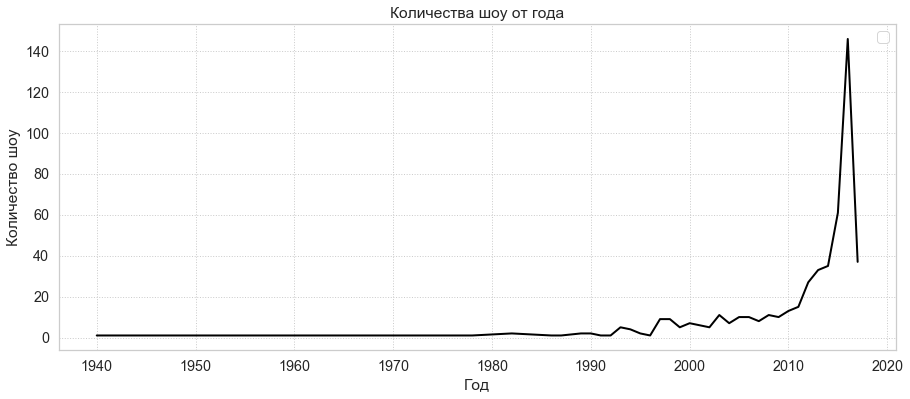

In [52]:
plt.figure(figsize = (15,6))

plt.plot(x,
        data.groupby('release year').count().iloc[:,1],
        color = 'black',
        lw = 2)

plt.grid(ls = ':')
plt.xlabel('Год')
plt.ylabel('Количество шоу')
plt.title('Количества шоу от года')
plt.legend()
plt.show()

**Вывод:** с 90-ых наблдюдается рост количества запускаемых шоу. Пик приходится на 2016.

Сравните среднюю оценку пользователей в 2016 со средней оценкой в 2017. Можно ли сделать вывод, что 2017 год успешнее для Netflix? "Успешнее" означает, что пользователи в среднем ставили более высокие оценки.
Ответить на этот вопрос вам поможет график, который вы построили выше.

In [56]:
print('Средний рейтинг в 2016 году: {}'.format(data.loc[data['release year'] == 2016, 'user rating score'].mean()))
print('Средний рейтинг в 2017 году: {}'.format(data.loc[data['release year'] == 2017, 'user rating score'].mean()))

Средний рейтинг в 2016 году: 83.11579623287672
Средний рейтинг в 2017 году: 84.30722128378379


**Вывод:** Видимо рост количества сериалов вредит качеству, поэтому в $2017$ получилось лучше среднее качество шоу.

Ниже представлены два графика, показывающие распределение шоу по рейтинговым группам. Какой тип графика визуально более интерпретируемый? [Подсказка](https://mipt-stats.gitlab.io/courses/ad_fivt/Jobs.jpg)

Постройтре самостоятельно график, который считаете более интерпретируемым. Сделайте вывод.

![jSOsBIhxK3U.jpg](attachment:jSOsBIhxK3U.jpg)

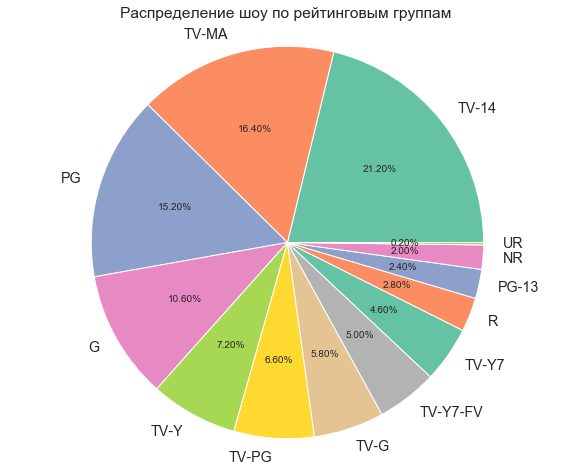

In [57]:
fig, ax = plt.subplots(figsize = (10,8))

percentage = data['rating'].value_counts(normalize=True)
ax.pie(percentage,\
       labels=percentage.index,
       autopct='%1.2f%%')
ax.axis('equal')
ax.title.set_text('Распределение шоу по рейтинговым группам')
plt.show()

**Вывод:** Понятнее выглядят диаграмнные графики. Спасибо за **жирную** подказку

Составьте топ-13 самых высоко оцененных шоу. Выберите из данного топа шоу, которое вам наиболее нравится. Обозначим это шоу N.
Ответьте на следующие вопросы.
* Какое шоу является худшим по оценкам в рейтинговой группе, к которой принадлежит N?  
* Сколько шоу было выпущено в одном году с N?  
* Насколько бы изменилась средняя оценка шоу, выпущенных в одном году с N, если бы Netflix не запустили шоу N?

In [58]:
data.sort_values(by = 'user rating score', ascending =False).head(13)

,title,rating,ratingLevel,release year,user rating score
41,13 Reasons Why,TV-MA,For mature audiences. May not be suitable for...,2017,99.0
62,Family Guy,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
88,Finding Dory,PG,mild thematic elements,2016,98.0
350,Lost,TV-14,Parents strongly cautioned. May be unsuitable ...,2010,98.0
64,Friends,TV-14,Parents strongly cautioned. May be unsuitable ...,2003,98.0
63,Criminal Minds,TV-14,Parents strongly cautioned. May be unsuitable ...,2016,98.0
10,Once Upon a Time,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0
8,The Walking Dead,TV-MA,For mature audiences. May not be suitable for...,2015,98.0
25,Marvel's Iron Fist,TV-MA,Parents strongly cautioned. May be unsuitable ...,2017,98.0
27,The Flash,TV-PG,Parental guidance suggested. May not be suitab...,2016,98.0


Возьму единственный сериал, в котором я посмотрел хоть что-то (первые две серии) --- `13 Reasons Why`

In [59]:
data.loc[data.rating == data.loc[41, 'rating'], :].sort_values(by = 'user rating score').head(1)

,title,rating,ratingLevel,release year,user rating score
380,Bitten,TV-MA,For mature audiences. May not be suitable for...,2016,56.0


In [60]:
data.loc[data['release year'] == data.loc[41, 'release year'], :].count()[0]

37

Разница средних оценок шоу

In [61]:
mean_why = data.loc[data['release year'] == data.loc[41, 'release year'], :]
y = mean_why.loc[:, 'user rating score'].mean()
x = mean_why.loc[mean_why['title'] != '13 Reasons Why', 'user rating score'].mean()
print('Разница = {}'.format(y - x))

Разница = 0.40813274211711814


Ответьте на следующие вопросы, проанализировав `boxplot`-график.
* Какую рейтинговую группу зрители оценивали выше всего в последние пять лет, за которые есть данные? 
* Как менялись оценки пользователей с течением времени? Постройте `boxplot` для каждого десятилетия.

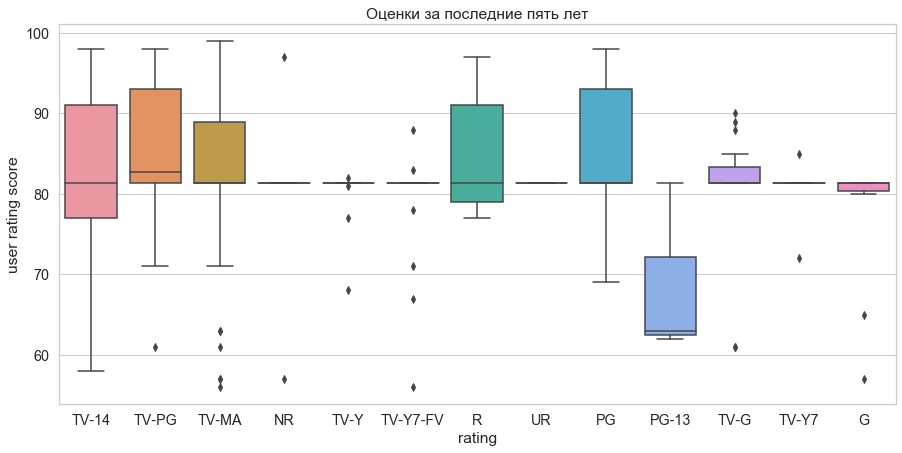

In [62]:
plt.figure(figsize=(15, 7))
sns.boxplot(x = 'rating', 
            y = 'user rating score',
            data = data.loc[data['release year'] >= data['release year'].max() - 5, :])
plt.title('Оценки за последние пять лет')
plt.show()

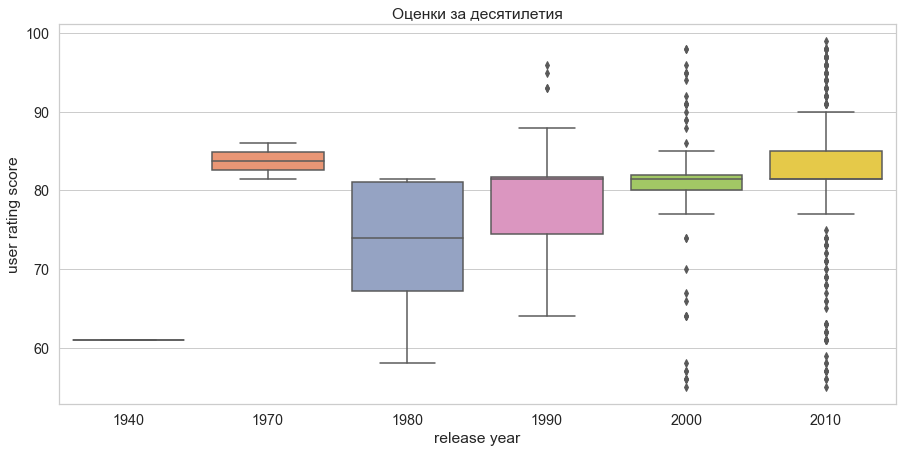

In [63]:
plt.figure(figsize=(15, 7))
sns.boxplot(x = data['release year']//10 * 10, 
            y = data['user rating score'])
plt.title('Оценки за десятилетия')
plt.show()

**Вывод:** Рейтинговая группа с наилучшими оценками за последние пять лет --- `TV-PG` и `PG`.  Видно, что до 70-ых оценки были в дефиците. Далее их стало очень много, что начали появлятся выбросы. При этом наблюдается рост качества шоу с $1980$ года.

---
### Задача 4

В данной задаче вам нужно будет продолжить анализ данных о видео на YouTube. Информация об имени категории видео содержится в файле `RU_category_id.json`. Следующий код читает этот файл, извлекает из него необходимую информацию, и записывает в виде `pandas`-таблицы.

In [72]:
import json

with open('./RU_category_id.json') as json_file:
    json_data = json.load(json_file)
    
category = pd.DataFrame(columns=['id', 'name'])

for item in json_data['items']:
    category = category.append(
        {'id': int(item['id']),
         'name': item['snippet']['title']},
        ignore_index=True
    )
    
category['id'] = category['id'].astype(int)
category

,id,name
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


Добавьте к вашим данным имена категорий с помощью `pd.merge`.

In [74]:
data_youtube = pd.merge(data, category,
        left_on='category_id', right_on='id', how = 'inner')
del data_youtube['id']
data_youtube.head()

,trending_date,category_id,views,likes,dislikes,comment_count,name
0,14,22,62408,334,190,50,People & Blogs
1,14,22,330043,43841,2244,2977,People & Blogs
2,14,22,112851,3566,122,80,People & Blogs
3,14,22,97006,2259,330,887,People & Blogs
4,14,22,148974,5434,5247,1612,People & Blogs


Составьте сводную таблицу о количестве просмотров по дням для каждой категории видео с помощю функции `pivot_table`.

In [75]:
pv_t = pd.pivot_table(data_youtube, 
              index= ['name'],
              columns=['trending_date'],
              values= 'views',
              aggfunc = np.sum)
pv_t

trending_date,14,15,16,17,18,19,20,21
name,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0


Визуализируйте таблицу с помощью `heatmap`. Для информативности поделите все числа на $10^6$.

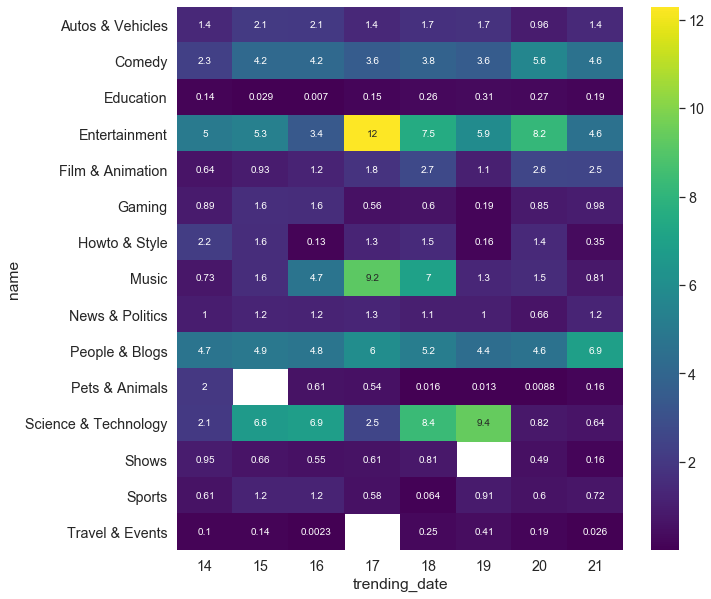

In [76]:
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(pv_t/1e6, annot=True, ax=ax, cmap="viridis")
plt.show()

Сделайте аналогичную сводную таблицу, добавив суммы по строкам и столбцам, назвав их "Всего просмотров".

In [77]:
pv_t = pd.pivot_table(data_youtube, 
              index= ['name'],
              columns=['trending_date'],
              values= 'views',
              aggfunc = np.sum,
              margins=True,
              margins_name='Всего просмотров')
pv_t

trending_date,14,15,16,17,18,19,20,21,Всего просмотров
name,,,,,,,,,
Autos & Vehicles,1350890.0,2076443.0,2051608.0,1386676.0,1713087.0,1736740.0,962761.0,1421017.0,12699222
Comedy,2310887.0,4152389.0,4156893.0,3556025.0,3806238.0,3556578.0,5648120.0,4627423.0,31814553
Education,139723.0,28850.0,6963.0,146943.0,256076.0,310830.0,270585.0,186909.0,1346879
Entertainment,5010384.0,5289490.0,3373346.0,12299938.0,7519942.0,5877590.0,8174020.0,4585563.0,52130273
Film & Animation,636616.0,931837.0,1160112.0,1820958.0,2725012.0,1075440.0,2574276.0,2532978.0,13457229
Gaming,885597.0,1609621.0,1583149.0,557074.0,600307.0,193316.0,851814.0,981217.0,7262095
Howto & Style,2191619.0,1562421.0,129763.0,1250164.0,1468139.0,156958.0,1402284.0,350009.0,8511357
Music,733907.0,1585619.0,4720464.0,9179397.0,6972429.0,1329904.0,1527219.0,809274.0,26858213
News & Politics,1010044.0,1225112.0,1174092.0,1251367.0,1056007.0,1028665.0,657263.0,1214178.0,8616728


В чем проблема с информативностью подобных таблиц? Исправьте это.

*Подсказка*: посмотрите на графики, которые вы построили ранее. 

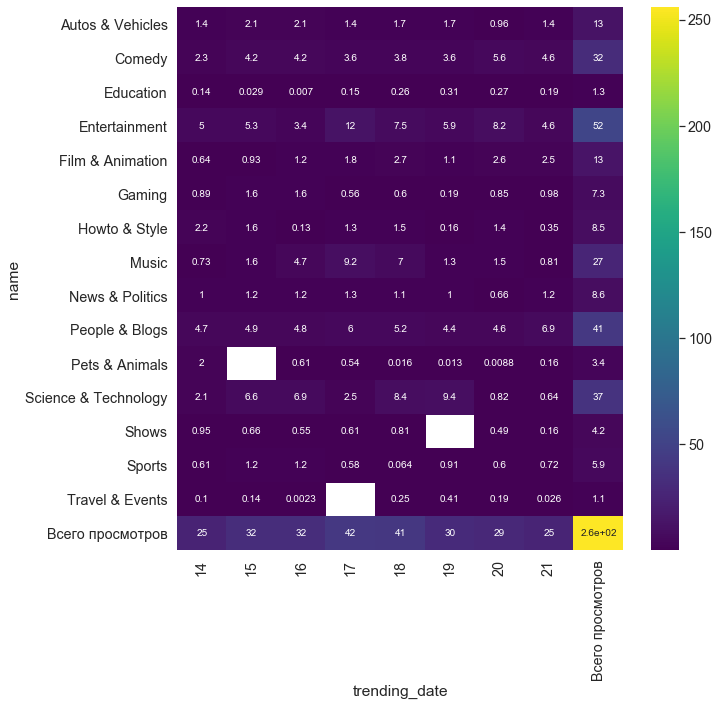

In [79]:
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(pv_t/1e6, annot=True, ax=ax, cmap="viridis")
plt.show()

**Вывод:** Во первых `heatmap` информативнее, потому что мы построили и на данных в $10^7$ раз меньше, а в изначальной таблице слишком большие числа, и их не удобно анализировать. В данной же таблице сразу видно, что самая интерсеная тема видео --- `Entertainment`, а самый просматриаемый день был 17-го и 18-го, что и не удивительно так как это пятница и суббота, если верить календарю. Я правда удивлен, что 19-го ноября не так много просмотров, это же воскресенье, что еще можно делать в воскресенье, кроме как отдыхать и смотреть видосики в ютубчике. 

---

### Задача 5

<a target="_blank" href="yelp.com">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

![Yelp_Logo_No_Outline_Color.jpg](attachment:Yelp_Logo_No_Outline_Color.jpg)

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.

------

#### Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [80]:
data = pd.read_csv('yelp_business.csv', index_col=0)
data.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [81]:
data.loc[:, ['city', 'state','name']].rename(columns = { 'name': 'count'}).groupby(['city', 'state']).count()\
    .sort_values(by = 'count', ascending = False). head()

,,count
city,state,
Las Vegas,NV,26764
Phoenix,AZ,17213
Toronto,ON,17205
Charlotte,NC,8553
Scottsdale,AZ,8227


Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

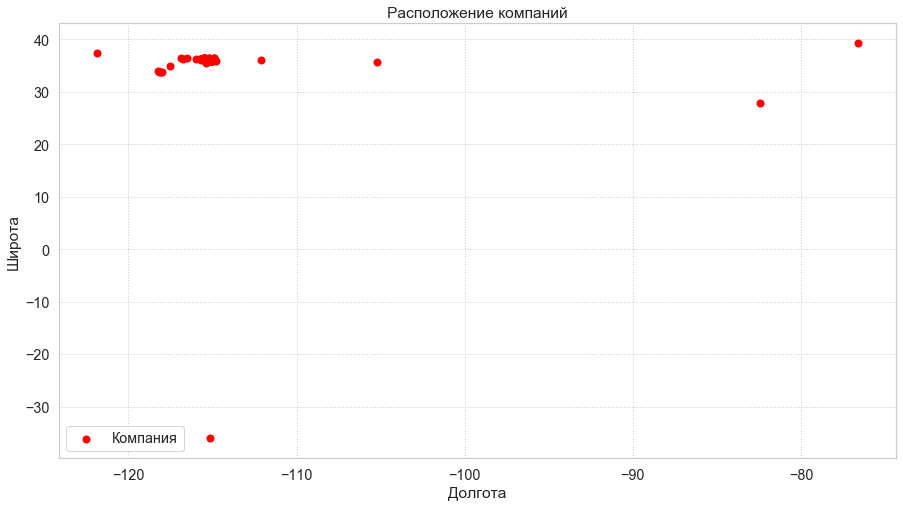

In [82]:
data_city = data.loc[data['city'] == 'Las Vegas', :]

plt.figure(figsize=(15,8))
plt.scatter(data_city.longitude,
            data_city.latitude,
            lw = 2,
            label = 'Компания',
            color = 'red')

plt.grid(ls = ':')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.title('Расположение компаний')
plt.legend()
plt.show()

Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. 

На этом графике должны выделяться некоторые улицы. Откройте карту города `N` и сравните ее с построенным графиком. Попробуйте также для графиков в этой задаче автоматически подгружать карту города в качестве фона графика, используя <a href="https://plotly.com/python/scattermapbox/">примеры</a>.

*Замечание. Если у вас возникает ошибка `Notebook validation failed`, попробуйте открыть ноутбук текстовым редактором и в самом конце заменить `"nbformat_minor": 1` на `"nbformat_minor": 4`.*

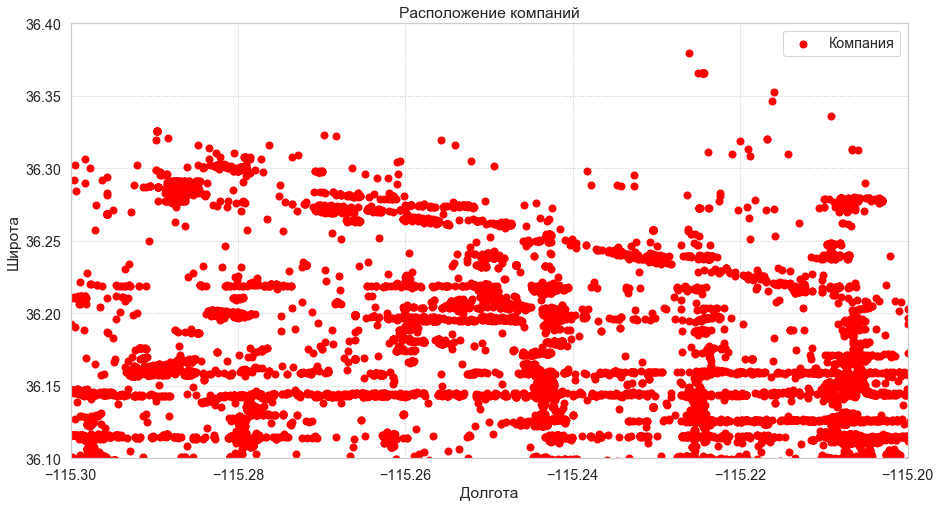

In [83]:
plt.figure(figsize=(15,8))
plt.scatter(data_city.longitude,
            data_city.latitude,
            lw = 2,
            label = 'Компания',
            color = 'red')

plt.grid(ls = ':')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.title('Расположение компаний')
plt.xlim(-115.3,-115.2)
plt.ylim(36.1,36.4)
plt.legend()
plt.show()

In [85]:
import plotly.graph_objects as go

# центровка
map_center = dict(lat=data_city.iloc[0, 7], lon=data_city.iloc[0, 8])

fig = go.Figure(go.Scattermapbox(lat=data_city.latitude, 
                                 lon=data_city.longitude, 
                                 text=data_city.name))
fig.update_layout(mapbox_style="open-street-map", mapbox=dict(center=map_center, zoom = 9))
fig.show()

#### Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [86]:
data = pd.read_csv('yelp_review.csv', index_col=0)
data.head()

c:\users\acer\appdata\local\programs\python\python37\lib\site-packages\numpy\lib\arraysetops.py:569: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



,business_id,stars
0,AEx2SYEUJmTxVVB18LlCwA,5
1,VR6GpWIda3SfvPC-lg9H3w,5
2,CKC0-MOWMqoeWf6s-szl8g,5
3,ACFtxLv8pGrrxMm6EgjreA,4
4,s2I_Ni76bjJNK9yG60iD-Q,4


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [87]:
data_new_index = data.set_index('business_id')
data_new_index = data_new_index.loc[data_city.business_id.unique(),:]
data_new_index.reset_index(inplace = True)

Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [88]:
data_mean_rating = data_new_index.groupby('business_id').aggregate([np.mean, np.size])
data_mean_rating.head()

stars      
                            mean  size
business_id                           
--9e1ONYQuAa-CB_Rrw7Tw  4.088904  1451
--DdmeR16TRb3LsjG0ejrQ  3.200000     5
--WsruI0IGEoeRmkErU5Gg  4.928571    14
--Y7NhBKzLTbNliMUX_wfg  4.875000     8
--e8PjCNhEz32pprnPhCwQ  3.473684    19

Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша.

In [89]:
data_mean_rating.columns = ['rating','count of marks']
data_mean_rating.head()

,rating,count of marks
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, `stars`, `count`.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [90]:
data_city = data_city.set_index('business_id').join(data_mean_rating)
data_city.head()

,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories,rating,count of marks
business_id,,,,,,,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...,4.000000,5
OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods,1.444444,9
VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23
1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20
DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$.

In [91]:
import plotly.graph_objects as go

# центровка
map_center = dict(lat=data_city.iloc[0, 6], lon=data_city.iloc[0, 7])

fig = go.Figure(go.Scattermapbox(lat=data_city.latitude, 
                                 lon=data_city.longitude, 
                                 text=data_city.name,
                                 marker=dict(colorbar=dict(title="Рейтинги"),
                                             color=data_city.rating)))
fig.update_layout(mapbox_style="open-street-map", mapbox=dict(center=map_center, zoom = 9))
fig.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [92]:
data_city['r_lon'] = np.round(data_city.longitude*4, decimals=1)*0.25
data_city['r_lat'] = np.round(data_city.latitude*4, decimals=1)*0.25
data_city.head()

,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories,rating,count of marks,r_lon,r_lat
business_id,,,,,,,,,,,,,,
kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...,4.000000,5,-115.275,36.200
OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods,1.444444,9,-115.250,36.200
VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23,-115.125,36.075
1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20,-115.275,36.050
DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25,-115.050,36.100


Для получения средней оценки компании по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

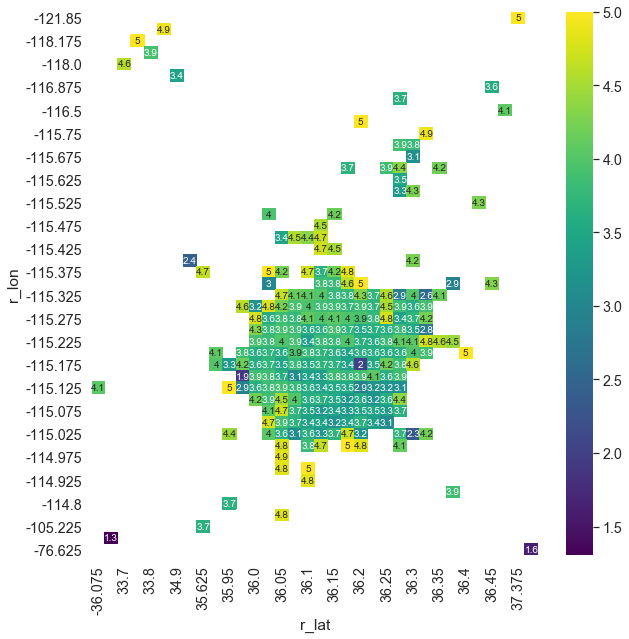

In [93]:
table = pd.pivot_table(data_city,
                   values = 'rating',
                   index = ['r_lon'],
                   columns= ['r_lat'],
                   aggfunc= np.mean)

f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(table, annot=True, ax=ax, cmap="viridis")
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** Просто в в этих районах очень мало данных. И если там только есть компания с хорошим выбросом, к примеру в хорошую сторону, то мы подстроимся под него и усредним оцнку по нему, хотя там может быть несколько компаний со слабой оценкой. Поэтому ошибочно полагать, что в этом районе все хорошо, опираясь лишь на маленькую выборку.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

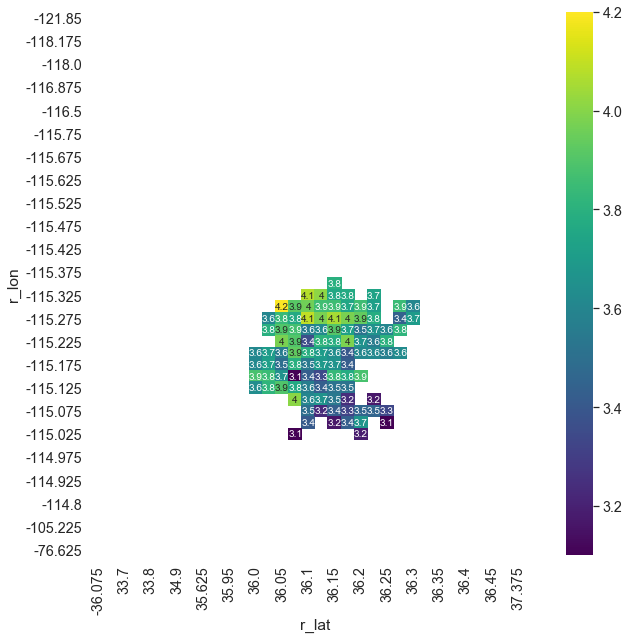

In [94]:
mask = pd.pivot_table(data_city,
                   values = 'rating',
                   index = ['r_lon'],
                   columns= ['r_lat'],
                   aggfunc= 'count',
                   dropna=True) < 30


f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(table, annot=True, ax=ax, cmap="viridis", mask =mask, vmin=3.1, vmax=4.2)
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** Теперь в каждом районе много информации, также мы сильно сократили диапазон цветов, что увеличивает цветовую гамму, и точнее показывает информацию про район.

#### Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [96]:
# проверка на None в 'categories'
data_city.isna().mean()

name              0.000000
neighborhood      0.182558
address           0.000000
city              0.000000
state             0.000000
postal_code       0.004482
latitude          0.000000
longitude         0.000000
is_open           0.000000
categories        0.000000
rating            0.000000
count of marks    0.000000
r_lon             0.000000
r_lat             0.000000
dtype: float64

Ищу через префикс, так как посмотрев данные нашел довольно много слов `restaurants`, что означает множественное число того, что мы ищем, и, кажется, эти объекты тоже следует отнести к ресторанам. Если просто сравнивать слова через `restaurant`, то у меня вышло что мы потерли в $10^3$ данных меньше, чем через префикс

In [100]:
def check_restaraunts(categorie):
    categorie = categorie.replace(';', ' ')
    categorie = categorie.replace('&', ' ')
    for i in categorie.lower().split():
        if i.startswith('restaurant'):
            return True
    return False

In [101]:
data_city['check'] = data_city.categories.apply(check_restaraunts)
data_rest = data_city.loc[data_city.check == True, :]
data_rest.loc[data_rest['count of marks'] >= 5, :].head()

,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories,rating,count of marks,r_lon,r_lat,check
business_id,,,,,,,,,,,,,,,
Pd52CjgyEU3Rb8co6QfTPw,"""Flight Deck Bar & Grill""",Southeast,"""6730 S Las Vegas Blvd""",Las Vegas,NV,89119,36.066914,-115.170848,1,Nightlife;Bars;Barbeque;Sports Bars;American (...,3.769231,13,-115.175,36.075,True
4srfPk1s8nlm1YusyDUbjg,"""Subway""",Southeast,"""6889 S Eastern Ave, Ste 101""",Las Vegas,NV,89119,36.064652,-115.118954,1,Fast Food;Restaurants;Sandwiches,2.666667,6,-115.125,36.075,True
n7V4cD-KqqE3OXk0irJTyA,"""GameWorks""",Southeast,"""6587 Las Vegas Blvd S, Ste 171""",Las Vegas,NV,89119,36.068259,-115.178877,1,Arcades;Arts & Entertainment;Gastropubs;Restau...,3.117479,349,-115.175,36.075,True
Wpt0sFHcPtV5MO9He7yMKQ,"""McDonald's""",Eastside,"""3020 E Desert Inn Rd""",Las Vegas,NV,89121,36.130013,-115.109310,1,Restaurants;Fast Food;Burgers,2.150000,20,-115.100,36.125,True
W1Yr6c2XDx_RBjb6WsV-aQ,"""Divine Cafe at the Springs Preserve""",Westside,"""333 S Valley View Blvd""",Las Vegas,NV,89152,36.170706,-115.190288,1,Restaurants;Cafes;American (New);Bars;Nightlif...,4.050000,140,-115.200,36.175,True


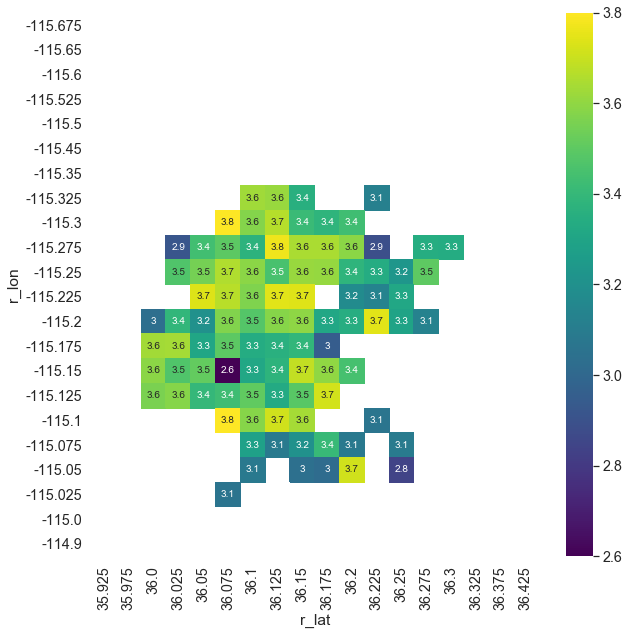

In [102]:
table = pd.pivot_table(data_rest,
                   values = 'rating',
                   index = ['r_lon'],
                   columns= ['r_lat'],
                   aggfunc= np.mean)

mask = pd.pivot_table(data_rest,
                   values = 'rating',
                   index = ['r_lon'],
                   columns= ['r_lat'],
                   aggfunc= 'count',
                   dropna=True) < 10

f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(table, annot=True, ax=ax, cmap="viridis", mask= mask, vmin=2.6, vmax=3.8)
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** При ограничении снизу на отзывы мы опять же отсеиваем рестораны с недостаточным количеством данных. К примеру, если был один отзыв, что ресторан плохой, а он просто придирчивый человек, то будет грустно, если ресторан хороший. Нельзя делать выводы на маленькои количестве данных

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [103]:
top_rest = data_rest.loc[data_rest['count of marks'] >= 50, :].sort_values(by = 'rating', ascending= False)
top_rest = top_rest.loc[:, ['name', 'rating', 'count of marks','latitude','longitude', 'categories']].set_index('name')
top_rest.head(10)

,rating,count of marks,latitude,longitude,categories
name,,,,,
"""Lip Smacking Foodie Tours""",4.966480,179,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...
"""Pepito Shack""",4.907692,65,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
"""Bosa Boba Cafe""",4.890909,55,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
"""Garden Grill""",4.868132,91,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...
"""Brew Tea Bar""",4.848069,1165,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
"""Poppa Naps BBQ""",4.836538,104,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
"""Zenaida's Cafe""",4.833333,180,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes
"""El Frescos Cocina Mexicana""",4.816754,191,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...
"""Blaqcat Ultra Hookah Lounge""",4.809524,63,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [105]:
import plotly.graph_objects as go

# центровка
map_center = dict(lat=top_rest.iloc[0, 2], lon=top_rest.iloc[0, 3])

top_rest = top_rest.loc[top_rest.rating >= 4.7, :]
colors=['red' for i in range(top_rest.shape[0])]
for i in range(10):
    colors[i] = 'blue'

fig = go.Figure(go.Scattermapbox(lat=top_rest.latitude, 
                                 lon=top_rest.longitude, 
                                 text=top_rest.index,
                                 mode='markers',    
                                 marker=dict(color=colors)))

fig.update_layout(mapbox_style="open-street-map", mapbox=dict(center=map_center, zoom = 9))
fig.show()

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** Вася оч придирчивый. Видно, что буржуй). Он ходит в хорошие рестораны, с большим количеством оценок. Вывод я бы себе сделал такой: Чем больше данных, тем лучше